In [1]:
import pandas as pd 
import numpy as np 
from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model  import Ridge,Lasso,RidgeCV, LassoCV, ElasticNet, ElasticNetCV, LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
import seaborn as sns
import pickle

In [2]:
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/diabetes.csv")

In [3]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [4]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
df['BMI'] = df['BMI'].replace(0 , df['BMI'].mean())

In [6]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [7]:
df['BloodPressure'] = df['BloodPressure'].replace(0,df['BloodPressure'].mean())

In [8]:
df['Insulin'] = df['Insulin'].replace(0,df['Insulin'].mean())

In [9]:
df['Glucose'] = df['Glucose'].replace(0,df['Glucose'].mean())

In [10]:
df['SkinThickness'] = df['SkinThickness'].replace(0,df['SkinThickness'].mean())

In [28]:
fig ,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = df , ax = ax)

<AxesSubplot:>

In [13]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [14]:
q = df['BloodPressure'].quantile(.70)

In [15]:
q

78.0

In [16]:
df['BloodPressure'] < q

0      True
1      True
2      True
3      True
4      True
       ... 
763    True
764    True
765    True
766    True
767    True
Name: BloodPressure, Length: 768, dtype: bool

In [17]:
 df[df['BloodPressure'] < q]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [18]:
q = df['Insulin'].quantile(.90)

In [19]:
 df[df['Insulin'] < q]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [20]:

df_new = df[df['Insulin'] < q]

In [21]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [23]:
fig ,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new , ax = ax)

<AxesSubplot:>

In [24]:
q = df['Pregnancies'].quantile(.98)
df_new = df[df['Pregnancies'] < q]

q = df_new['BMI'].quantile(.99)
df_new = df_new[df_new['BMI']< q]

q = df_new['SkinThickness'].quantile(.99)
df_new = df_new[df_new['SkinThickness']< q]

q = df_new['Insulin'].quantile(.95)
df_new = df_new[df_new['Insulin']< q]

q = df_new['DiabetesPedigreeFunction'].quantile(.99)
df_new = df_new[df_new['DiabetesPedigreeFunction']< q]


q = df_new['Age'].quantile(.99)
df_new = df_new[df_new['Age']< q]


In [25]:
def outlier_removal(self,data):
        def outlier_limits(col):
            Q3, Q1 = np.nanpercentile(col, [75,25])
            IQR= Q3-Q1
            UL= Q3+1.5*IQR
            LL= Q1-1.5*IQR
            return UL, LL

        for column in data.columns:
            if data[column].dtype != 'int64':
                UL, LL= outlier_limits(data[column])
                data[column]= np.where((data[column] > UL) | (data[column] < LL), np.nan, data[column])

        return data


In [26]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


<AxesSubplot:>

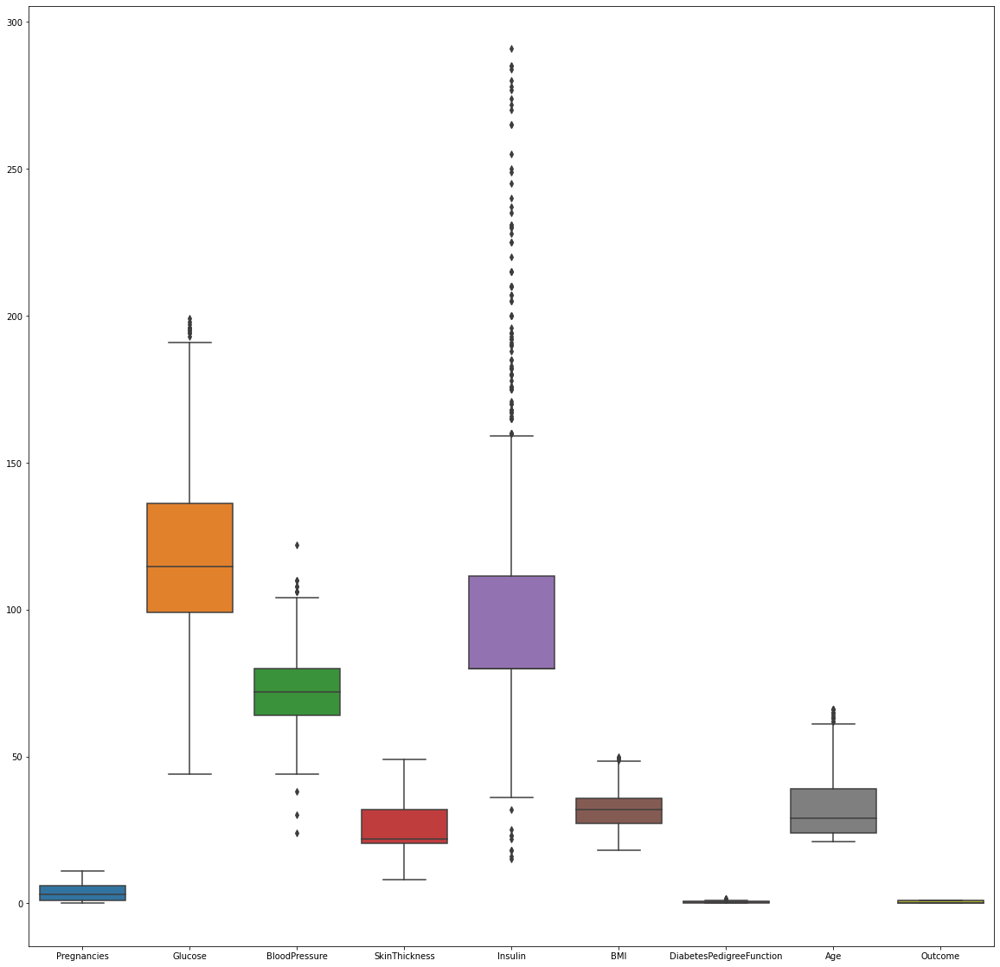

In [50]:
fig ,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new , ax = ax)

<AxesSubplot:>

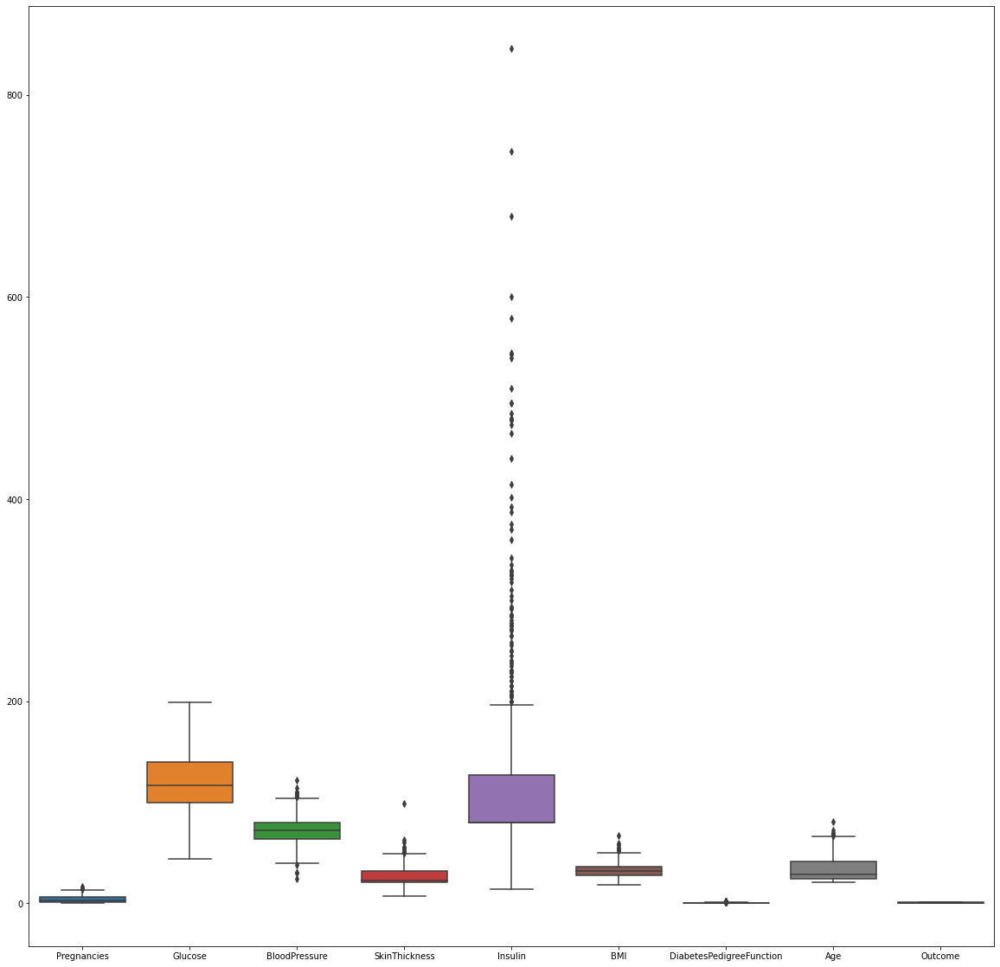

In [44]:
fig ,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = df , ax = ax)

In [27]:
ProfileReport(df_new)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [29]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [19]:
y = df_new['Outcome']
y

0      1
1      0
2      1
3      0
5      0
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 674, dtype: int64

In [13]:
X = df_new.drop(columns=['Outcome'])

In [14]:
 X

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35,79.799479,33.6,0.627,50
1,1,85.0,66.0,29,79.799479,26.6,0.351,31
2,8,183.0,64.0,0,79.799479,23.3,0.672,32
3,1,89.0,66.0,23,94.000000,28.1,0.167,21
5,5,116.0,74.0,0,79.799479,25.6,0.201,30
...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48,180.000000,32.9,0.171,63
764,2,122.0,70.0,27,79.799479,36.8,0.340,27
765,5,121.0,72.0,23,112.000000,26.2,0.245,30
766,1,126.0,60.0,0,79.799479,30.1,0.349,47


In [15]:
scalar = StandardScaler()
ProfileReport(pd.DataFrame(scalar.fit_transform(X)))
X_scaled = scalar.fit_transform(X)

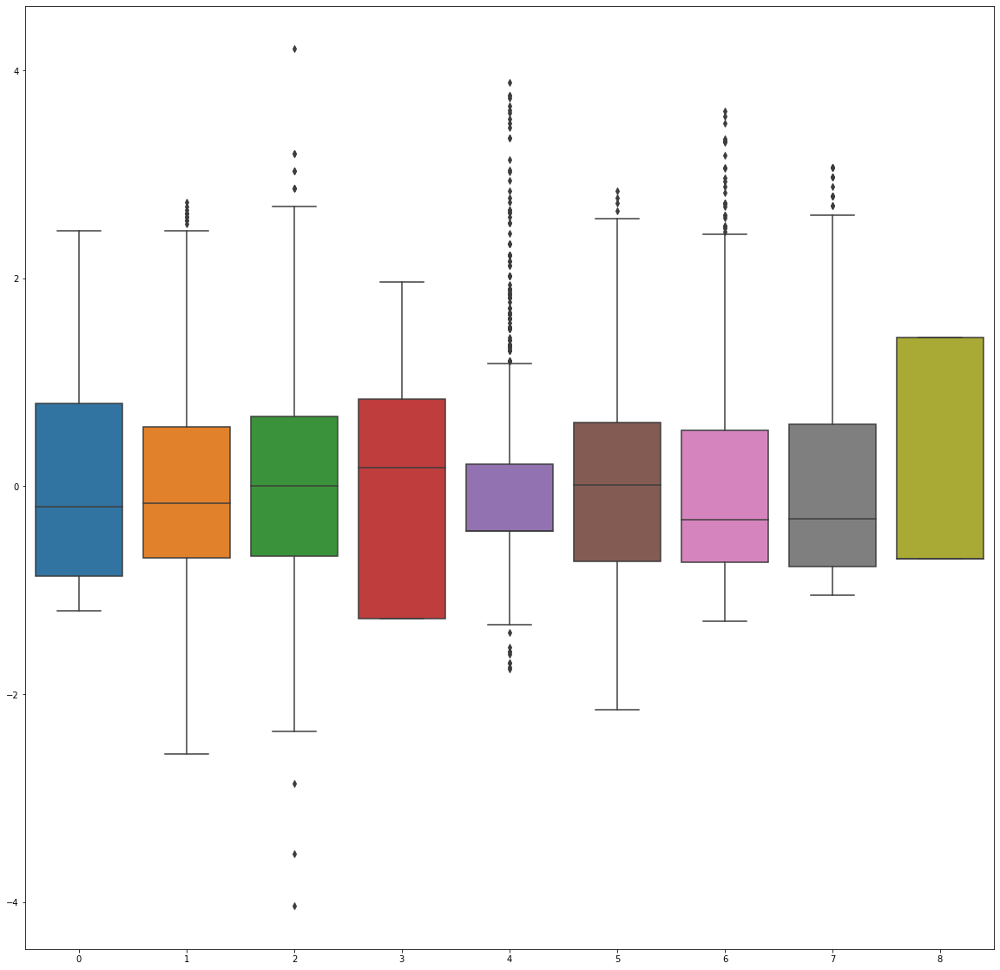

In [16]:
df_new_scalar = pd.DataFrame(scalar.fit_transform(df_new))
fig ,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new_scalar , ax = ax)

In [17]:
X_scaled

array([[ 7.96753910e-01,  9.83984062e-01,  4.52611463e-04, ...,
         2.65819648e-01,  6.30484542e-01,  1.60141519e+00],
       [-8.64793539e-01, -1.16977621e+00, -5.04474494e-01, ...,
        -8.31445036e-01, -3.38078670e-01, -1.32706484e-01],
       [ 1.46137289e+00,  2.18051755e+00, -6.72783529e-01, ...,
        -1.34872696e+00,  7.88402456e-01, -4.14369227e-02],
       ...,
       [ 4.64444420e-01,  6.09439465e-02,  4.52611463e-04, ...,
        -8.94145875e-01, -7.10063091e-01, -2.23976046e-01],
       [-8.64793539e-01,  2.31877301e-01, -1.00940160e+00, ...,
        -2.82812694e-01, -3.45097244e-01,  1.32760650e+00],
       [-8.64793539e-01, -8.96282840e-01, -1.67856424e-01, ...,
        -2.35787064e-01, -4.64413001e-01, -8.62862978e-01]])

In [20]:
y

0      1
1      0
2      1
3      0
5      0
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 674, dtype: int64

In [21]:
def vif_score(x):
    scaler = StandardScaler()
    arr = scaler.fit_transform(x)
    return pd.DataFrame([[x.columns[i], variance_inflation_factor(arr,i)] for i in range(arr.shape[1])], columns=["FEATURE", "VIF_SCORE"])


In [66]:
vif_score(X)

,FEATURE,VIF_SCORE
0,Pregnancies,1.449056
1,Glucose,1.304263
2,BloodPressure,1.262686
3,SkinThickness,1.470049
4,Insulin,1.271017
5,BMI,1.513160
6,DiabetesPedigreeFunction,1.042300
7,Age,1.662728


In [22]:
x_train, x_test, y_train, y_test = train_test_split(X_scaled , y , test_size = .20 , random_state = 144)

In [23]:
x_train

array([[-0.86479354,  0.19769063, -1.85094678, ...,  0.21879402,
         1.80609569, -0.40651517],
       [ 2.45830136,  1.22329076,  0.33707068, ...,  0.21879402,
         3.1782269 ,  1.69268475],
       [ 0.13213493,  0.91561072,  1.09446134, ..., -0.47091521,
        -0.90658316, -0.49778473],
       ...,
       [-0.86479354, -0.28092276,  1.17861586, ..., -0.28281269,
        -1.06801036, -0.86286298],
       [ 1.46137289,  0.02675728,  0.50537972, ..., -1.08224839,
        -0.13454002,  2.87918905],
       [-0.86479354, -0.75953616, -0.33616546, ..., -0.73739378,
         2.27283086, -0.95413254]])

In [24]:
x_test

array([[ 1.32134931e-01, -1.44176079e-01,  4.52611463e-04, ...,
        -4.70915211e-01, -2.50346495e-01,  1.23633694e+00],
       [-1.19710303e+00,  6.76304024e-01, -8.41092564e-01, ...,
        -1.53682948e+00, -8.43415997e-01, -1.04540210e+00],
       [ 2.45830136e+00,  8.13050708e-01,  1.85185200e+00, ...,
         7.36075942e-01, -6.78479508e-01,  1.69268475e+00],
       ...,
       [ 7.96753910e-01, -5.54416131e-01, -5.04474494e-01, ...,
        -1.19197486e+00, -6.96025943e-01, -3.15245608e-01],
       [-5.32484049e-01, -1.20396288e+00, -2.43135269e-01, ...,
         1.38528976e-02, -5.03015158e-01, -1.04540210e+00],
       [-8.64793539e-01, -1.64838960e+00, -2.01925581e+00, ...,
        -1.80330804e+00, -4.36338705e-01, -9.54132539e-01]])

In [77]:
x_test[0]

array([ 1.32134931e-01, -1.44176079e-01,  4.52611463e-04, -6.09921498e-01,
       -4.34192020e-01, -4.70915211e-01, -2.50346495e-01,  1.23633694e+00])

In [33]:
log_reg = LogisticRegression(verbose=1)

In [34]:
log_reg.fit(x_train,y_train )

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [36]:
x_test[0]

array([ 1.32134931e-01, -1.44176079e-01,  4.52611463e-04, -1.27311675e+00,
       -4.34192020e-01, -4.70915211e-01, -2.50346495e-01,  1.23633694e+00])

In [46]:
log_reg.predict_proba([x_test[2]])

array([[0.29321486, 0.70678514]])

In [47]:
0.29321486+0.70678514

1.0

In [48]:
log_reg.predict([x_test[2]])

array([1], dtype=int64)

In [92]:
logr.predict_log_proba([x_test[1]])

array([[-0.08742167, -2.48040456]])

In [86]:
type(y_test)

pandas.core.series.Series

In [91]:
y_test.iloc[1]

0

In [88]:
y_test

406    1
511    0
24     1
751    0
689    1
      ..
3      0
469    0
587    0
60     0
97     0
Name: Outcome, Length: 135, dtype: int64

In [101]:
logr = LogisticRegression(verbose=1)

In [102]:
logr.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [103]:
logr_liblinear

LogisticRegression(solver='liblinear', verbose=1)

In [104]:
logr

LogisticRegression(verbose=1)

In [49]:
y_pred= log_reg.predict(x_test)

In [50]:
y_pred

array([0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0], dtype=int64)

In [55]:
len(np.array(y_test))

135

In [53]:
from sklearn.metrics import confusion_matrix

In [65]:
from sklearn.metrics import accuracy_score

In [67]:
from sklearn.metrics import classification_report

In [71]:
from sklearn.metrics import roc_curve

In [111]:
y_pred_default = logr.predict(x_test)

In [112]:
y_pred_default

array([0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0], dtype=int64)

In [59]:
confusion_matrix=confusion_matrix(y_test,y_pred)

In [56]:
confusion_matrix(y_test,y_pred).ravel()

array([78,  9, 25, 23], dtype=int64)

In [ ]:
tn, fp, fn, tp 

In [1]:
confusion_matrix=confusion_matrix(y_test,y_pred)

NameError: name 'confusion_matrix' is not defined

In [60]:
true_negative = confusion_matrix[0][0]
false_positive = confusion_matrix[0][1]
false_negative = confusion_matrix[1][0]
true_positive = confusion_matrix[1][1]

In [61]:
# Breaking down the formula for Accuracy
Accuracy = (true_positive + true_negative) / (true_positive +false_positive + false_negative + true_negative)
Accuracy

0.7481481481481481

In [66]:
accuracy_score(y_test,y_pred)

0.7481481481481481

In [68]:
classification_report(y_test,y_pred)

'              precision    recall  f1-score   support\n\n           0       0.76      0.90      0.82        87\n           1       0.72      0.48      0.57        48\n\n    accuracy                           0.75       135\n   macro avg       0.74      0.69      0.70       135\nweighted avg       0.74      0.75      0.73       135\n'

In [62]:
# Precison
Precision = true_positive/(true_positive+false_positive)
Precision

0.71875

In [63]:
# Recall
Recall = true_positive/(true_positive+false_negative)
Recall

0.4791666666666667

In [64]:
# F1 Score
F1_Score = 2*(Recall * Precision) / (Recall + Precision)
F1_Score

0.575

In [69]:
# Area Under Curve
auc = roc_auc_score(y_test, y_pred)
auc

0.6878591954022989

In [78]:
y_test

406    1
511    0
24     1
751    0
689    1
      ..
3      0
469    0
587    0
60     0
97     0
Name: Outcome, Length: 135, dtype: int64

In [79]:
y_pred

array([0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0], dtype=int64)

In [99]:
np.array(y_test)

array([1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0,
       1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0], dtype=int64)

In [ ]:
xtrain ytrain xtest y test

In [166]:
# predict probabilities
lr_probs = log_reg.predict_proba(x_test)


In [168]:
lr_probs

array([[0.82496892, 0.17503108],
       [0.90980139, 0.09019861],
       [0.29321486, 0.70678514],
       [0.70161615, 0.29838385],
       [0.27205598, 0.72794402],
       [0.94388092, 0.05611908],
       [0.76763683, 0.23236317],
       [0.71365395, 0.28634605],
       [0.83127632, 0.16872368],
       [0.53533035, 0.46466965],
       [0.67491304, 0.32508696],
       [0.97508383, 0.02491617],
       [0.99295283, 0.00704717],
       [0.77824326, 0.22175674],
       [0.58547127, 0.41452873],
       [0.73019546, 0.26980454],
       [0.1433574 , 0.8566426 ],
       [0.55131763, 0.44868237],
       [0.78448624, 0.21551376],
       [0.20342825, 0.79657175],
       [0.97511901, 0.02488099],
       [0.29770949, 0.70229051],
       [0.94273256, 0.05726744],
       [0.88285177, 0.11714823],
       [0.98386161, 0.01613839],
       [0.91195699, 0.08804301],
       [0.94572977, 0.05427023],
       [0.92348632, 0.07651368],
       [0.44538371, 0.55461629],
       [0.89157128, 0.10842872],
       [0.

In [102]:
log_reg.predict_proba(np.array(x_test))

array([[0.82496892, 0.17503108],
       [0.90980139, 0.09019861],
       [0.29321486, 0.70678514],
       [0.70161615, 0.29838385],
       [0.27205598, 0.72794402],
       [0.94388092, 0.05611908],
       [0.76763683, 0.23236317],
       [0.71365395, 0.28634605],
       [0.83127632, 0.16872368],
       [0.53533035, 0.46466965],
       [0.67491304, 0.32508696],
       [0.97508383, 0.02491617],
       [0.99295283, 0.00704717],
       [0.77824326, 0.22175674],
       [0.58547127, 0.41452873],
       [0.73019546, 0.26980454],
       [0.1433574 , 0.8566426 ],
       [0.55131763, 0.44868237],
       [0.78448624, 0.21551376],
       [0.20342825, 0.79657175],
       [0.97511901, 0.02488099],
       [0.29770949, 0.70229051],
       [0.94273256, 0.05726744],
       [0.88285177, 0.11714823],
       [0.98386161, 0.01613839],
       [0.91195699, 0.08804301],
       [0.94572977, 0.05427023],
       [0.92348632, 0.07651368],
       [0.44538371, 0.55461629],
       [0.89157128, 0.10842872],
       [0.

In [173]:
fpr, tpr, thresholds = roc_curve(y_test,lr_probs)

In [175]:
fpr

array([0.        , 0.        , 0.        , 0.01149425, 0.01149425,
       0.04597701, 0.04597701, 0.05747126, 0.05747126, 0.06896552,
       0.06896552, 0.08045977, 0.08045977, 0.09195402, 0.09195402,
       0.13793103, 0.13793103, 0.17241379, 0.17241379, 0.2183908 ,
       0.2183908 , 0.22988506, 0.22988506, 0.26436782, 0.26436782,
       0.32183908, 0.32183908, 0.37931034, 0.37931034, 0.3908046 ,
       0.3908046 , 0.4137931 , 0.4137931 , 0.42528736, 0.42528736,
       0.43678161, 0.43678161, 0.45977011, 0.45977011, 0.50574713,
       0.50574713, 0.52873563, 0.52873563, 0.55172414, 0.55172414,
       0.56321839, 0.56321839, 0.73563218, 0.73563218, 1.        ])

In [176]:
tpr

array([0.        , 0.02083333, 0.14583333, 0.14583333, 0.20833333,
       0.20833333, 0.22916667, 0.22916667, 0.29166667, 0.29166667,
       0.3125    , 0.3125    , 0.33333333, 0.33333333, 0.47916667,
       0.47916667, 0.5       , 0.5       , 0.5625    , 0.5625    ,
       0.58333333, 0.58333333, 0.60416667, 0.60416667, 0.64583333,
       0.64583333, 0.70833333, 0.70833333, 0.72916667, 0.72916667,
       0.77083333, 0.77083333, 0.8125    , 0.8125    , 0.83333333,
       0.83333333, 0.85416667, 0.85416667, 0.875     , 0.875     ,
       0.91666667, 0.91666667, 0.9375    , 0.9375    , 0.95833333,
       0.95833333, 0.97916667, 0.97916667, 1.        , 1.        ])

In [174]:
thresholds

array([1.97610318, 0.97610318, 0.92962047, 0.92348615, 0.85888399,
       0.8330282 , 0.82516931, 0.815762  , 0.78317606, 0.76483934,
       0.72794402, 0.72390962, 0.70678514, 0.70229051, 0.53997648,
       0.46466965, 0.44868237, 0.42046993, 0.40066576, 0.33307486,
       0.3327831 , 0.32668824, 0.32624187, 0.31510122, 0.3051657 ,
       0.2762804 , 0.26616619, 0.23236317, 0.22946805, 0.22945754,
       0.21551376, 0.21032553, 0.20867182, 0.20703647, 0.20548207,
       0.19094447, 0.19048619, 0.17917811, 0.17503108, 0.15528175,
       0.14952299, 0.12757446, 0.12340975, 0.11714823, 0.11646536,
       0.10865099, 0.10842872, 0.0665675 , 0.06633178, 0.00704717])

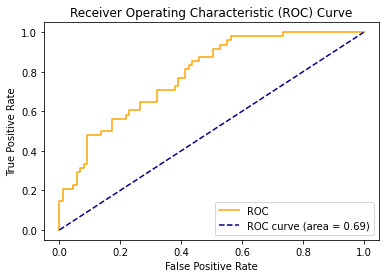

In [177]:
plt.plot(fpr, tpr, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='ROC curve (area = %0.2f)' % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

In [119]:
def model_eval(y_true,y_pred):
    tn, fp, fn, tp = confusion_matrix(y_test,y_pred).ravel()
    accuracy=(tp+tn)/(tp+tn+fp+fn)
    precision=tp/(tp+fp)
    recall=tp/(tp+fn)
    specificity=tn/(fp+tn)
    F1_Score = 2*(recall * precision) / (recall + precision)
    result={"Accuracy":accuracy,"Precision":precision,"Recall":recall,'Specficity':specificity,'F1':F1_Score}
    return result
model_eval(y_test,y_pred_liblinear)


{'Accuracy': 0.7481481481481481,
 'Precision': 0.7058823529411765,
 'Recall': 0.5,
 'Specficity': 0.8850574712643678,
 'F1': 0.5853658536585366}

In [120]:
model_eval(y_test,y_pred_default)

{'Accuracy': 0.7481481481481481,
 'Precision': 0.7058823529411765,
 'Recall': 0.5,
 'Specficity': 0.8850574712643678,
 'F1': 0.5853658536585366}

In [127]:
auc = roc_auc_score(y_test,y_pred_liblinear)

In [128]:
roc_auc_score(y_test,y_pred_default)

0.692528735632184